# Text classification 2

## Setup

Below we are importing required libraries. We will be using [scikit-learn](https://scikit-learn.org) for text classification. We will use the Naive Bayes Classifier. Scikit-learn has different feature extraction methods based on counts or tf-idf weights. We will also use NLTK for pre-processing.

In [1]:
from sklearn.datasets import load_files
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.datasets import fetch_20newsgroups

import matplotlib.pyplot as plt
from wordcloud import WordCloud

import re

import nltk
from nltk import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer 
from nltk.stem import SnowballStemmer 
from nltk.stem import PorterStemmer 
from nltk.corpus import wordnet

from nltk.corpus import movie_reviews

from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
import numpy as np 
import pandas as pd
import random

Run this to make sure we have the stop word list and other data for pre-processing.

This cell will also download one of the data-sets that comes pre-packaged with NLTK: a data-set of movie reviews.

In [2]:
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('movie_reviews')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\ariji\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\movie_reviews.zip.


True

This cell loads some defaults for the stop word lists.

In [3]:
stop_words = None
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as sklearn_stop_words
nltk_stop_words = nltk.corpus.stopwords.words('english')

Define some functions ...

In [4]:
# nice preview of document
def get_preview(docs, targets, target_names, doc_id, max_len=0):
    preview = ''
    if max_len < 1:
        preview += 'Label\n'
        preview += '=====\n'
    else:
        preview += str(doc_id)
        preview += '\t'
    if isinstance(targets[doc_id], str):
        preview += targets[doc_id]
    else:
        preview += target_names[targets[doc_id]]
    if max_len < 1:
        preview += '\n\nFull Text\n'
        preview += '=========\n'
        preview += docs[doc_id]
        preview += '\n'
    else:
        excerpt = get_excerpt(docs[doc_id], max_len)
        preview += '\t' + excerpt
    return preview

_RE_COMBINE_WHITESPACE = re.compile(r"\s+")

# generate an excerpt
def get_excerpt(text, max_len):
    excerpt = _RE_COMBINE_WHITESPACE.sub(' ',text[0:max_len])
    if max_len < len(text):
        excerpt += '...'
    return excerpt.strip()

# combine a defined stop word list (or no stop word list) with any extra stop words defined
def set_stop_words(stop_word_list, extra_stop_words):
    if len(extra_stop_words) > 0:
        if stop_word_list is None:
            stop_word_list = []
        stop_words = list(stop_word_list) + extra_stop_words
    else:
        stop_words = stop_word_list
        
    return stop_words

# initiate stemming or lemmatising
def set_normaliser(normalise):
    if normalise == 'PorterStemmer':
        normaliser = PorterStemmer()
    elif normalise == 'SnowballStemmer':
        normaliser = SnowballStemmer('english')
    elif normalise == 'WordNetLemmatizer':
        normaliser = WordNetLemmatizer()
    else:
        normaliser = None
    return normaliser

# we are using a custom tokenisation process to allow different tokenisers and stemming/lemmatising ...
def tokenise(doc):
    global tokeniser, normalise, normaliser
    
    if tokeniser == 'sklearn':
        tokenizer = RegexpTokenizer(r"(?u)\b\w\w+\b") # this is copied straight from sklearn source
        tokens = tokenizer.tokenize(doc)
    elif tokeniser == 'word_tokenize':
        tokens = word_tokenize(doc)
    elif tokeniser == 'wordpunct':
        tokens = wordpunct_tokenize(doc)
    elif tokeniser == 'nopunct':
        tokenizer = RegexpTokenizer(r'\w+')
        tokens = tokenizer.tokenize(doc)
    else:
        tokens = word_tokenize(doc)
        
    # if using a normaliser then iterate through tokens and return the normalised tokens ...
    if normalise == 'PorterStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'SnowballStemmer':
        return [normaliser.stem(t) for t in tokens]
    elif normalise == 'WordNetLemmatizer':
        # NLTK's lemmatiser needs parts of speech, otherwise assumes everything is a noun
        pos_tokens = nltk.pos_tag(tokens)
        lemmatised_tokens = []
        for token in pos_tokens:
            # NLTK's lemmatiser needs specific values for pos tags - this rewrites them ...
            # default to noun
            tag = wordnet.NOUN
            if token[1].startswith('J'):
                tag = wordnet.ADJ
            elif token[1].startswith('V'):
                tag = wordnet.VERB
            elif token[1].startswith('R'):
                tag = wordnet.ADV
            lemmatised_tokens.append(normaliser.lemmatize(token[0],tag))
        return lemmatised_tokens
    else:
        # no normaliser so just return tokens
        return tokens

# CountVectorizer pre-processor - remove numerics.
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\d+', '', text)
    return text


## Load corpus and set train/test split

The data set is movies reviews data-set. The reviews are annotated with sentiment polarities "pos" and "neg". We can get more information on the data-set and download it from [NLTK's data-set page](http://www.nltk.org/nltk_data/) and the [movie reviews data page](https://www.cs.cornell.edu/people/pabo/movie-review-data/)).

This cell also sets the train/test split. 80% of the data is used for training and 20% is used for testing. The documents are assigned to each group randomly. It can be useful to rerun this cell to reshuffle our dataset so we can evaluate our model using different data for training and testing.

In [5]:
# define list of class names.
dataset_target_names = ['neg', 'pos']

# assign the train/test split - 0.2 is 80% for training, 20% for testing
test_size = 0.2

#
dataset_data = [(movie_reviews.raw(fileid))
             for category in movie_reviews.categories()
             for fileid in movie_reviews.fileids(category)]
dataset_target = [category
             for category in movie_reviews.categories()
             for fileid in movie_reviews.fileids(category)]

# do the train test split ...
# docs_train and docs_test are the documents
# y_train and y_test are the labels
docs_train, docs_test, y_train, y_test = train_test_split(dataset_data, 
                                                          dataset_target, 
                                                          test_size = test_size, 
                                                          random_state=None)

## Inspect documents and labels

In the next cells we can look at the data we have imported. Firstly, we will preview the document labels and a brief excerpt.

In [6]:
for train_id in range(len(docs_train)):
    print(get_preview(docs_train, y_train, dataset_target_names, train_id, max_len=80))

0	pos	defending your life is an imaginative vision of the afterlife from the twisted m...
1	pos	harmless , silly and fun comedy about dim-witted wrestling fans gordie and sean ...
2	pos	this is a good year if you want plenty of sci-fi on your multiplex . >from the ...
3	pos	synopsis : shrek ( myers ) is an ogre living in contented solitude deep in the h...
4	neg	there was probably a good reason that the warner bros . studio chose not to allo...
5	neg	in times of crisis people are driven to desperate measures . of course what con...
6	neg	plot : something about a bunch of kids going into a haunted house and playing ou...
7	neg	at first i was intrigued by the strange cast and odd creatures on the galaxy que...
8	pos	are we victims of fate in life or can we create our own destiny ? director/writ...
9	neg	the title is taken from the writings of ralph waldo emerson describing the life ...
10	pos	your friends and neighbors is a rather bizarre film about 6 people , who hop in ...
11	neg	i am 

We can use this cell to inspect a specific document and its label based on its index in the training set.The indexes will change each time we import the data above because of the random train/test split.

In [7]:
train_id = 11
print(get_preview(docs_train, y_train, dataset_target_names, train_id))

Label
=====
neg

Full Text
i am continually amazed at movies like this . 
that some producer would waste an abundance of talent and money on a script as abysmal as this one is mind-boggeling , but it seems to happen a lot nowadays . 
 " wild wild west " is a beautifully filmed , well acted , and well directed piece of garbage ; and its insipid screenplay is completely at fault . 
in short , this movie is a comedy without laughs . 
so many jokes fall flat that it borderlines surreal . 
the high production values keep it from being a total fiasco , but it's still pretty boring . 
will smith stars as jim west , an old western , r&b variation of the james bond character . 
west is teamed up with artemus gordon ( kevin kline ) , and they're pretty much polar oppisites : west prefers to solve his problems with an array of bullets , gordon traditionally favors a more pacifistic approach . 
talk about deeply developed characters . 
at any rate , this leads to the inevitable conflicts between m

## Feature extraction / Pre-processing

In [8]:
Vectorizer = CountVectorizer
lowercase = True
tokeniser = 'nopunct' # tokeniser setting nopunct based on tokenising with the regex \w+
normalise = None
stop_word_list = nltk_stop_words
extra_stop_words = []
min_df = 0.0
max_df = 1.0
max_features = 1000
ngram_range = (1, 1) 
encoding = 'utf-8'
decode_error = 'ignore' # what to do if contains characters not of the given encoding - options 'strict', 'ignore', 'replace'

### New settings for the feature selection step

The feature selection step selects the top features based on [univariate statistical tests](https://scikit-learn.org/stable/modules/feature_selection.html#univariate-feature-selection). Here we are using [mutual information scores](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html#sklearn.feature_selection.mutual_info_classif) to assess the dependency between each feature and the class labels. 

The value below sets the number of features to select and use in our classifier. In this case we will start with 100 features, based on the mutual information score.

In [9]:
kbest = 100

## Setup a pipeline: feature extraction → feature selection → classifier

**Important Note** When we change settings above or reload our dataset we should rerun this cell!

In [10]:
stop_words = set_stop_words(stop_word_list, extra_stop_words)
normaliser = set_normaliser(normalise)

pipeline = Pipeline([
    ('vectorizer', Vectorizer(tokenizer = tokenise,
                              lowercase = lowercase,
                              min_df = min_df, 
                              max_df = max_df, 
                              max_features = max_features,
                              stop_words = stop_words, 
                              ngram_range = ngram_range,
                              encoding = encoding, 
                              preprocessor = preprocess_text,
                              decode_error = decode_error)),
    ('selector', SelectKBest(score_func = mutual_info_classif, k=kbest)),
    ('classifier', MultinomialNB()), #here is where we would specify an alternative classifier
])

print('Classifier settings')
print('===================')
print('classifier:', type(pipeline.steps[2][1]).__name__)
print('selector:', type(pipeline.steps[1][1]).__name__)
print('vectorizer:', type(pipeline.steps[0][1]).__name__)
print('classes:', dataset_target_names)
print('lowercase:', lowercase)
print('tokeniser:', tokeniser)
print('normalise:', normalise)
print('min_df:', min_df)
print('max_df:', max_df)
print('max_features:', max_features)
if stop_word_list == nltk_stop_words:
    print('stop_word_list:', 'nltk_stop_words')
elif stop_word_list == sklearn_stop_words:
    print('stop_word_list:', 'sklearn_stop_words')
else:
    print('stop_word_list:', 'None')
print('extra_stop_words:', extra_stop_words)
print('ngram_range:', ngram_range)
print('encoding:', encoding)
print('decode_error:', decode_error)
print('kbest:', kbest)

Classifier settings
classifier: MultinomialNB
selector: SelectKBest
vectorizer: CountVectorizer
classes: ['neg', 'pos']
lowercase: True
tokeniser: nopunct
normalise: None
min_df: 0.0
max_df: 1.0
max_features: 1000
stop_word_list: nltk_stop_words
extra_stop_words: []
ngram_range: (1, 1)
encoding: utf-8
decode_error: ignore
kbest: 100


## Train the classifier and predict labels on test data

Because we are adding the feature selection step, the classifier will be slower as it has to calculate MI scores for each feature and rank them. This will increase the more features we extract.

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Evaluation metrics
              precision    recall  f1-score   support

         neg       0.81      0.73      0.77       197
         pos       0.76      0.84      0.80       203

    accuracy                           0.79       400
   macro avg       0.79      0.78      0.78       400
weighted avg       0.79      0.79      0.78       400



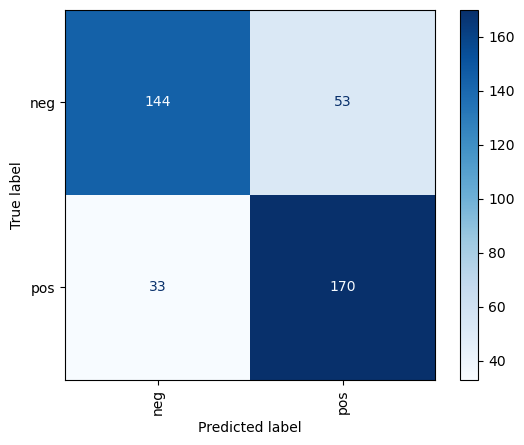

In [11]:
pipeline.fit(docs_train, y_train)
y_predicted = pipeline.predict(docs_test)

# print report
print('Evaluation metrics')
print('==================')
print(metrics.classification_report(y_test, y_predicted, target_names = dataset_target_names))
cm = metrics.confusion_matrix(y_true=y_test, y_pred=y_predicted, labels=dataset_target_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dataset_target_names)
disp = disp.plot(include_values=True, cmap='Blues', ax=None, xticks_rotation='vertical')
plt.show()

vect = pipeline.steps[0][1]
clf = pipeline.steps[2][1]

logodds=clf.feature_log_prob_[1]-clf.feature_log_prob_[0]
    
lookup = dict((v,k) for k,v in vect.vocabulary_.items())

We will now look at the features ranked by information gain (MI) and by class.

In [13]:
# Get SelectKBest feature scores
features = pipeline.named_steps['selector']
# get top k feature indices
cols = features.get_support(indices=True)
# get corresponding feature scores 
top_k_feature_scores  = [features.scores_[i] for i in cols]

# get vectorizer
featnames = pipeline.named_steps['vectorizer']
# get all feature names
fred = featnames.get_feature_names_out()
# get corresponding feature names
top_k_feature_names = [fred[i] for i in cols]

names_scores = list(zip(top_k_feature_names, top_k_feature_scores, logodds))
ns_df = pd.DataFrame(data = names_scores, columns=['Feature_names', 'Feature_Scores', 'Log odds'])

#Sort the dataframe for better visualization - change this to reorder by 
print('Top features by information gain')
ns_df_sorted = ns_df.sort_values(['Feature_Scores', 'Log odds', 'Feature_names'], ascending = [False, False, False])
display(ns_df_sorted[0:10])

print('Features most indicative of', dataset_target_names[0])
ns_df_sorted = ns_df.sort_values(['Log odds', 'Feature_Scores', 'Feature_names'], ascending = [True, False, False])
display(ns_df_sorted[0:10])

print('Features most indicative of', dataset_target_names[1])
ns_df_sorted = ns_df.sort_values(['Log odds', 'Feature_Scores', 'Feature_names'], ascending = [False, False, False])
display(ns_df_sorted[0:10])

Top features by information gain


,Feature_names,Feature_Scores,Log odds
11,bad,0.044518,-1.155771
97,worst,0.034583,-1.913580
73,ridiculous,0.023087,-2.103117
14,boring,0.022180,-1.514795
82,stupid,0.018671,-1.459875
45,life,0.017995,0.488523
92,wasted,0.017400,-1.863498
67,plot,0.017380,-0.580704
84,supposed,0.017333,-1.205813
13,best,0.016410,0.415658


Features most indicative of neg


,Feature_names,Feature_Scores,Log odds
73,ridiculous,0.023087,-2.103117
97,worst,0.034583,-1.913580
92,wasted,0.017400,-1.863498
91,waste,0.016217,-1.748618
21,dull,0.013896,-1.705362
9,awful,0.015231,-1.650099
85,terrible,0.013176,-1.605278
14,boring,0.022180,-1.514795
82,stupid,0.018671,-1.459875
52,mess,0.014154,-1.324294


Features most indicative of pos


,Feature_names,Feature_Scores,Log odds
86,terrific,0.013873,1.423244
16,cameron,0.009016,1.423244
40,jackie,0.007308,1.339474
25,excellent,0.013288,1.238321
63,perfectly,0.013313,1.228271
83,subtle,0.011539,1.210597
51,memorable,0.011475,1.114942
71,realistic,0.011299,1.058372
94,wonderful,0.013339,1.052029
22,effective,0.012720,1.022233


## List all features

Just for our reference here is a count and list of all features extracted in the first step of the pipeline.

In [16]:
print('Total Features: ',len(vect.get_feature_names_out()))
print(vect.get_feature_names_out())

Total Features:  1000
['ability' 'able' 'absolutely' 'across' 'act' 'acting' 'action' 'actor'
 'actors' 'actress' 'actual' 'actually' 'add' 'age' 'agent' 'ago' 'air'
 'alien' 'aliens' 'alive' 'allen' 'almost' 'alone' 'along' 'already'
 'also' 'although' 'always' 'amazing' 'america' 'american' 'among'
 'amount' 'amusing' 'animated' 'animation' 'annoying' 'another' 'anyone'
 'anything' 'anyway' 'apparently' 'appear' 'appearance' 'appears'
 'approach' 'around' 'art' 'ask' 'aspect' 'atmosphere' 'attempt'
 'attempts' 'attention' 'audience' 'audiences' 'away' 'awful' 'b' 'baby'
 'back' 'background' 'bad' 'based' 'basically' 'batman' 'battle'
 'beautiful' 'beauty' 'become' 'becomes' 'begin' 'beginning' 'begins'
 'behind' 'believable' 'believe' 'ben' 'best' 'better' 'beyond' 'big'
 'biggest' 'bill' 'bit' 'black' 'blood' 'blue' 'bob' 'body' 'bond' 'book'
 'boring' 'box' 'boy' 'break' 'brief' 'brilliant' 'bring' 'brings'
 'british' 'brother' 'brothers' 'brought' 'brown' 'bruce' 'budget'
 'buildi

This is a list of all features selected based on information gain.

In [17]:
print('Total Features: ',len(ns_df['Feature_names']))
print(list(ns_df['Feature_names']))

Total Features:  100
['action', 'alien', 'aliens', 'also', 'although', 'always', 'american', 'animated', 'attempt', 'awful', 'b', 'bad', 'beautiful', 'best', 'boring', 'brilliant', 'cameron', 'complex', 'dark', 'deep', 'different', 'dull', 'effective', 'emotional', 'especially', 'excellent', 'fails', 'family', 'fiction', 'film', 'filmmakers', 'finds', 'girl', 'gives', 'great', 'guess', 'guy', 'half', 'hilarious', 'intelligent', 'jackie', 'job', 'jokes', 'laugh', 'least', 'life', 'like', 'looks', 'love', 'many', 'maybe', 'memorable', 'mess', 'minute', 'movie', 'nothing', 'often', 'one', 'oscar', 'others', 'overall', 'people', 'perfect', 'perfectly', 'performance', 'performances', 'personal', 'plot', 'poor', 'powerful', 'quite', 'realistic', 'reason', 'ridiculous', 'science', 'script', 'solid', 'sometimes', 'star', 'still', 'story', 'strong', 'stupid', 'subtle', 'supposed', 'terrible', 'terrific', 'true', 'unfortunately', 'visual', 'war', 'waste', 'wasted', 'well', 'wonderful', 'world', 

## Inspect correctly/incorrectly classified documents

The wordclouds below only include the selected features that are used in the classification step.

neg Correctly classified


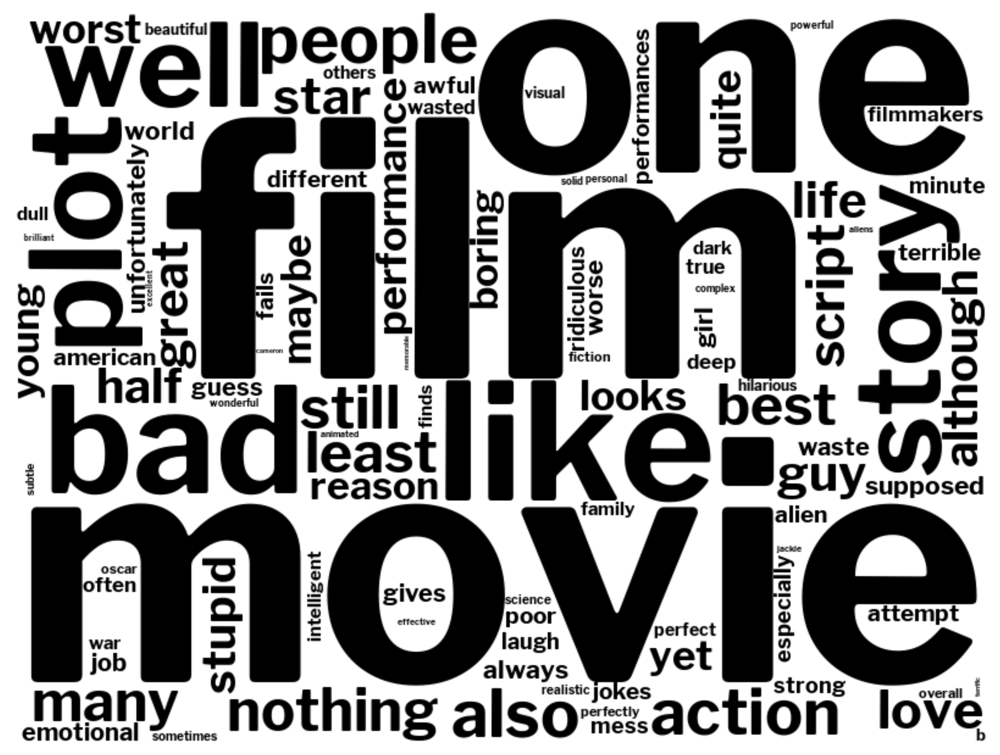

3	neg	synopsis : original " jurassic park " survivor alan grant ( neill ) is tricked b...
6	neg	phil ( radmar jao ) has a hairy problem . his beard is growing so rapidly that ...
9	neg	take a look at the following equation . . . . a christmas carol+ghostbusters=sc...
10	neg	" it was not scary . " these are the first words that came to mind after it wa...
11	neg	steve martin shines but sgt . bilko fails to impress based on the popular 50's...
13	neg	surrounded by hype , high hopes , and the promise of an over-the-top performance...
14	neg	" showgirls " is the first big-budget , big-studio film to receive an nc-17 rat...
18	neg	are you like me ? do you get annoyed seeing people talk on their cellulars in p...
21	neg	the second serial-killer thriller of the month is just awful . oh , it starts d...
22	neg	the sequel to the fugitive ( 1993 ) , u . s marshals is an average thriller usin...
24	neg	disillusioned and trying to find the spice of life , richard ( leonardo dicaprio...
30	neg	when

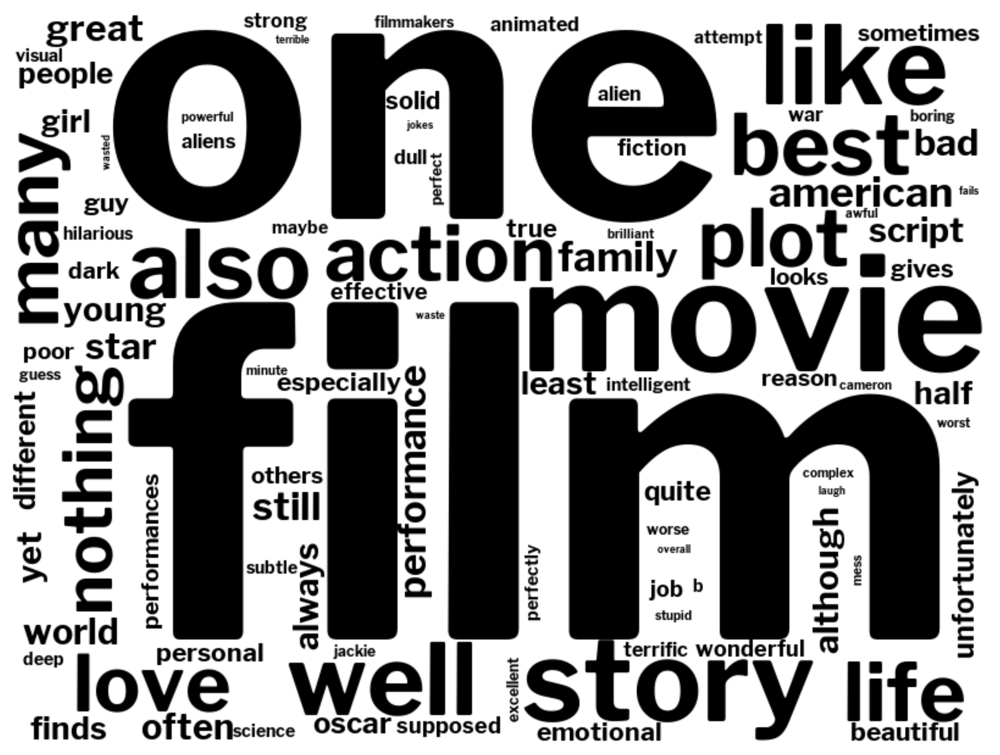

4	neg	in " the 13th warrior , " arab poet ahmed ibn fahdlan ( antonio banderas ) finds...
23	neg	be warned . . brit love story in the offing . effeminate , mild-mannered karl ...
26	neg	out of sight director steven sorderbergh baffles the hell out of us all in the l...
27	neg	starting with the little mermaid and most recently the lion king , the walt disn...
34	neg	susan granger's review of " american outlaws " ( warner bros . ) thomas edison'...
36	neg	i can't recall a previous film experience where the fairly good time i was havin...
58	neg	the art of woo attempts to be one of those films like breakfast at tiffany's in ...
64	neg	sometimes a stellar cast can compensate for a lot of things , and " pushing tin ...
69	neg	don't get me wrong -- i tend to appreciate besson's naive , unashamedly romantic...
70	neg	when considering david fincher's latest film , " the game " , four words come to...
73	neg	the army comedy genre has never turned out a truly good movie ( if you don't cou...
87	

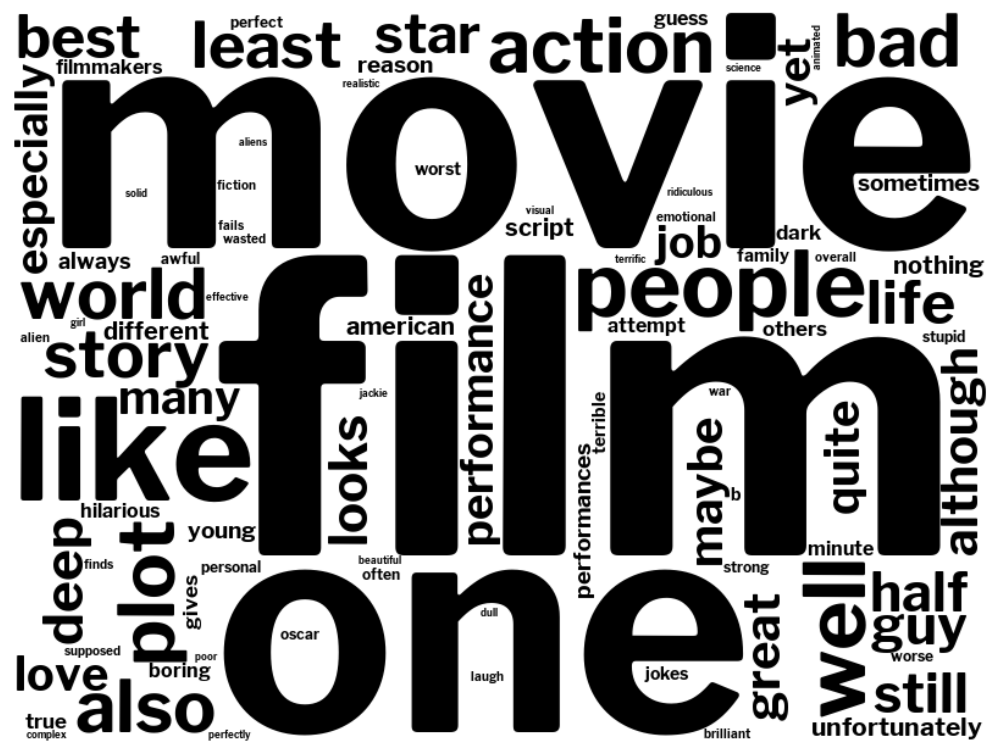

1	pos	every now and then a movie comes along from a suspect studio , with every indica...
8	pos	with stars like sigourney weaver ( " alien " trilogy ) and academy award winner ...
25	pos	i've noticed something lately that i've never thought of before . pseudo- subst...
44	pos	" the fighting sullivans " contains a major plot development in the last ten mi...
60	pos	[note that followups are directed to rec . arts . movies . current-films and rec...
63	pos	the reunion film is not an original idea in any way , shape , or form . it's be...
77	pos	he has spent his entire life in an awful little apartment , raised and cared for...
91	pos	it is always refreshing to see a superstar actor who gets paid more than enough ...
96	pos	i am starting to write this review before going to see strawberry and chocolate ...
106	pos	in zoolander , the world's most successful , influential and intellectually-chal...
107	pos	there exists a litany of differences between a successful action movie and a suc...
12

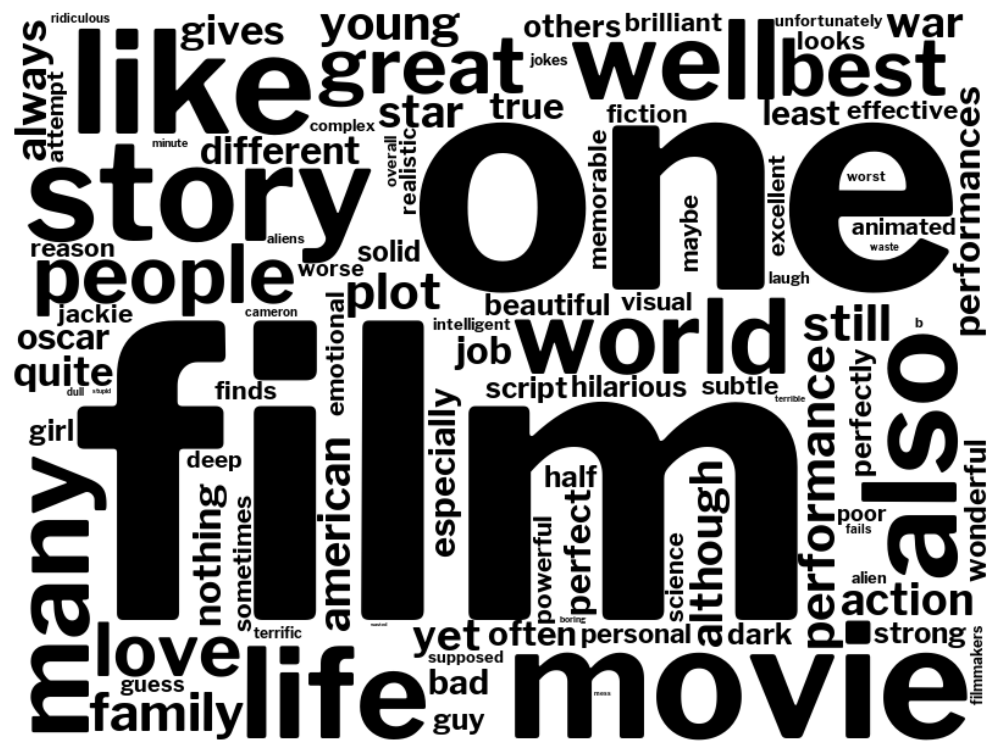

0	pos	most people fit into two different categories : you either love woody allen , or...
2	pos	as fairy tales go , cinderella has to be one of the most famous . almost everyo...
5	pos	" love is the devil " is a challenging film , munundating its audience with wil...
7	pos	eyes wide shut isn't the masterpiece many were hoping to see in stanley kubrick'...
12	pos	naturally , at the core of leon gast's " when we were kings " is the fight itsel...
15	pos	it's hard not to recommend " the others . " the supernatural thriller , written...
16	pos	before even seeing a single frame of the film , it would be easy to snicker at d...
17	pos	capsule : the verma family is having a wedding and all the relatives will come f...
19	pos	elizabeth is a potent historical drama set in england in the mid-1500s . it is ...
20	pos	susan granger's review of " the perfect storm " ( warner bros . ) " more peopl...
28	pos	set in the wild west , this carry on centres around the arrival of the rumpo kid...
29	pos	ze

In [18]:
# setup a counter for each cell in the confusion matrix
counter = {}
previews = {}
for true_target, target_name in enumerate(dataset_target_names):
    counter[target_name] = {}
    previews[target_name] = {}
    for predicted_target, ptarget_name in enumerate(dataset_target_names):
        counter[target_name][ptarget_name] = {}
        previews[target_name][ptarget_name] = ''

# get doc-term matrix for test docs
doc_terms = vect.transform(docs_test)

# iterate through all predictions, building the counter and preview of docs
# there is a better way to do this, but this will do!
for doc_id, prediction in enumerate(pipeline.predict(docs_test)):
    for k, v in enumerate(doc_terms[doc_id].toarray()[0]):
        if v > 0 and lookup[k] in list(ns_df['Feature_names']):
            if lookup[k] not in counter[y_test[doc_id]][prediction]:
                counter[y_test[doc_id]][prediction][lookup[k]] = 0
            counter[y_test[doc_id]][prediction][lookup[k]] += v
    
    previews[y_test[doc_id]][prediction] += get_preview(docs_test, y_test, dataset_target_names, doc_id, max_len=80) + '\n'

# output a wordcloud and preview of docs for each cell of confusion matrix ...
for true_target, target_name in enumerate(dataset_target_names):
    for predicted_target, ptarget_name in enumerate(dataset_target_names):
        if true_target == predicted_target:
            print(dataset_target_names[true_target],'Correctly classified')
        else:
            print(dataset_target_names[true_target],'incorrectly classified as',dataset_target_names[predicted_target])
        print('=================================================================')

        wordcloud = WordCloud(font_path='LibreFranklin-Bold.ttf',background_color="white", width=800, height=600, color_func=lambda *args, **kwargs: "black").generate_from_frequencies(counter[target_name][ptarget_name])
        plt.figure(figsize=(16, 8), dpi= 600)
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()        
        
        print(previews[target_name][ptarget_name])



## Preview document and its features

Use this cell to preview a document using its index in the test set. We can see the predicted label, its actual label, the full text and the features for this specific document.

In [19]:
test_id = 4

print('Prediction')
print('==========')
print(pipeline.predict([docs_test[test_id]])[0])
print()

print(get_preview(docs_test, y_test, dataset_target_names, test_id))

print('Features')
print('========')
for k, v in enumerate(vect.transform([docs_test[test_id]]).toarray()[0]):
    if v > 0 and lookup[k] in list(ns_df['Feature_names']):
        print(v, '\t', lookup[k])

Prediction
pos

Label
=====
neg

Full Text
in " the 13th warrior , " arab poet ahmed ibn fahdlan ( antonio banderas ) finds himself kicked out of baghdad for feeling up the king's old lady . 
with his translator ( screen legend omar sharif in a small role ) , ahmed heads north to act as ambassador to the northmen ( vikings ) . 
he finds a group of warriors mourning the loss of their king . 
a messenger soon arrives from another kingdom requesting assistance . 
a soothsayer says that thirteen warriors must answer the summons , twelve northmen and one outsider . 
thus , ahmed becomes the " 13th warrior . " 
on the trip , ahmed manages to learn the vikings' language by listening to their fireside conversations . 
a bit far-fetched , it's true , but we have to swallow it if this flick is going to manage a few lines of dialogue amidst the grunting . 
ahmed , who's called " ibn " by the vikings , forms friendships with herger the joyous ( dennis storh ? i ) and the viking leader buliwyf ( vl

# Automated Parameter Tuning

## Create Search Space

This step is to define the space of parameters and estimators we want to search through. We do this in the form of a dictionary and we use double underscore notation (__) to refer to the parameters of different steps in our pipeline. We will be trying out different values of k for the feature selector SelectKBest. However, this is not an exhaustive list of parameters that we can search. We could search parameters for the feature extraction step using the CountVectorizer or TfidfVectorizer as well.

In [20]:
pipeline2 = Pipeline([
    ('vectorizer', Vectorizer(tokenizer    = tokenise,
                              lowercase    = lowercase,
                              min_df       = min_df, 
                              max_df       = max_df,
                              max_features = max_features,
                              stop_words   = stop_words, 
                              ngram_range  = ngram_range,
                              encoding     = encoding, 
                              preprocessor = preprocess_text,
                              decode_error = decode_error)),
    ('selector', SelectKBest()),
    ('classifier', MultinomialNB()), #here is where we would specify an alternative classifier
])

In [21]:
search_space = [{'selector__k'              : range(50, 701, 50), #this starts at 50 and ends at 700 with steps of 50
                 #'selector__score_func'     : [mutual_info_classif, chi2],
                 #'vectorizer'               : [CountVectorizer(), TfidfVectorizer()],
                 #'vectorizer__max_features' : [700, 2000]
                }]

The scorers can be either be one of the predefined metric strings or a scorer callable, like the one returned by make_scorer

In [22]:
scoring = {'Accuracy': make_scorer(accuracy_score)}

# Run the GridSearch 

We will now pass our pipeline into GridSearchCV to test our search space (of feature preprocessing, feature selection, model selection, and hyperparameter tuning combinations) using cross-validation with 3-folds. 

Setting refit='Accuracy', refits an estimator on the whole dataset with the parameter setting that has the best cross-validated Accuracy score.
That estimator is made available at ``clf2.best_estimator_`` along with parameters like ``clf2.best_score_``, ``clf2.best_params_`` and ``clf2.best_index_``

In [23]:
clf2 = GridSearchCV(estimator          = pipeline2, 
                    param_grid         = search_space, 
                    scoring            = scoring,
                    cv                 = 5, 
                    refit              = 'Accuracy',
                    return_train_score = True,
                    verbose            = 1)
clf2 = clf2.fit(docs_train, y_train)

Fitting 5 folds for each of 14 candidates, totalling 70 fits


D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_patter

# Get the Results

We can access the best result of our search using the best_estimator_ attribute.

In [24]:
clf2.best_estimator_

Pipeline(steps=[('vectorizer',
                 CountVectorizer(decode_error='ignore', max_features=1000,
                                 min_df=0.0,
                                 preprocessor=<function preprocess_text at 0x000001E2297FBDC0>,
                                 stop_words=['i', 'me', 'my', 'myself', 'we',
                                             'our', 'ours', 'ourselves', 'you',
                                             "you're", "you've", "you'll",
                                             "you'd", 'your', 'yours',
                                             'yourself', 'yourselves', 'he',
                                             'him', 'his', 'himself', 'she',
                                             "she's", 'her', 'hers', 'herself',
                                             'it', "it's", 'its', 'itself', ...],
                                 tokenizer=<function tokenise at 0x000001E2297FBD30>)),
                ('selector', SelectKBest(k=300)),
                ('classifier', MultinomialNB())])

In [25]:
clf2.best_score_

0.819375

## Extracting from the cv_results_ dictionary

Demonstrating methods of extracting values from the cv_results_ dictionary.

In [26]:
means = clf2.cv_results_['mean_test_Accuracy']
stds  = clf2.cv_results_['std_test_Accuracy']

for mean, std, params in zip(means, stds, clf2.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

0.793 (+/-0.014) for {'selector__k': 50}
0.816 (+/-0.037) for {'selector__k': 100}
0.813 (+/-0.024) for {'selector__k': 150}
0.814 (+/-0.026) for {'selector__k': 200}
0.813 (+/-0.010) for {'selector__k': 250}
0.819 (+/-0.017) for {'selector__k': 300}
0.805 (+/-0.023) for {'selector__k': 350}
0.810 (+/-0.027) for {'selector__k': 400}
0.809 (+/-0.027) for {'selector__k': 450}
0.799 (+/-0.011) for {'selector__k': 500}
0.806 (+/-0.021) for {'selector__k': 550}
0.804 (+/-0.039) for {'selector__k': 600}
0.804 (+/-0.029) for {'selector__k': 650}
0.805 (+/-0.034) for {'selector__k': 700}


In [27]:
from sklearn.metrics import classification_report
y_true, y_pred = y_test, clf2.best_estimator_.predict(docs_test)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

         neg       0.81      0.78      0.79       197
         pos       0.79      0.82      0.81       203

    accuracy                           0.80       400
   macro avg       0.80      0.80      0.80       400
weighted avg       0.80      0.80      0.80       400



## Visualise the results

Plot code taken from https://scikit-learn.org/stable/auto_examples/model_selection/plot_multi_metric_evaluation.html


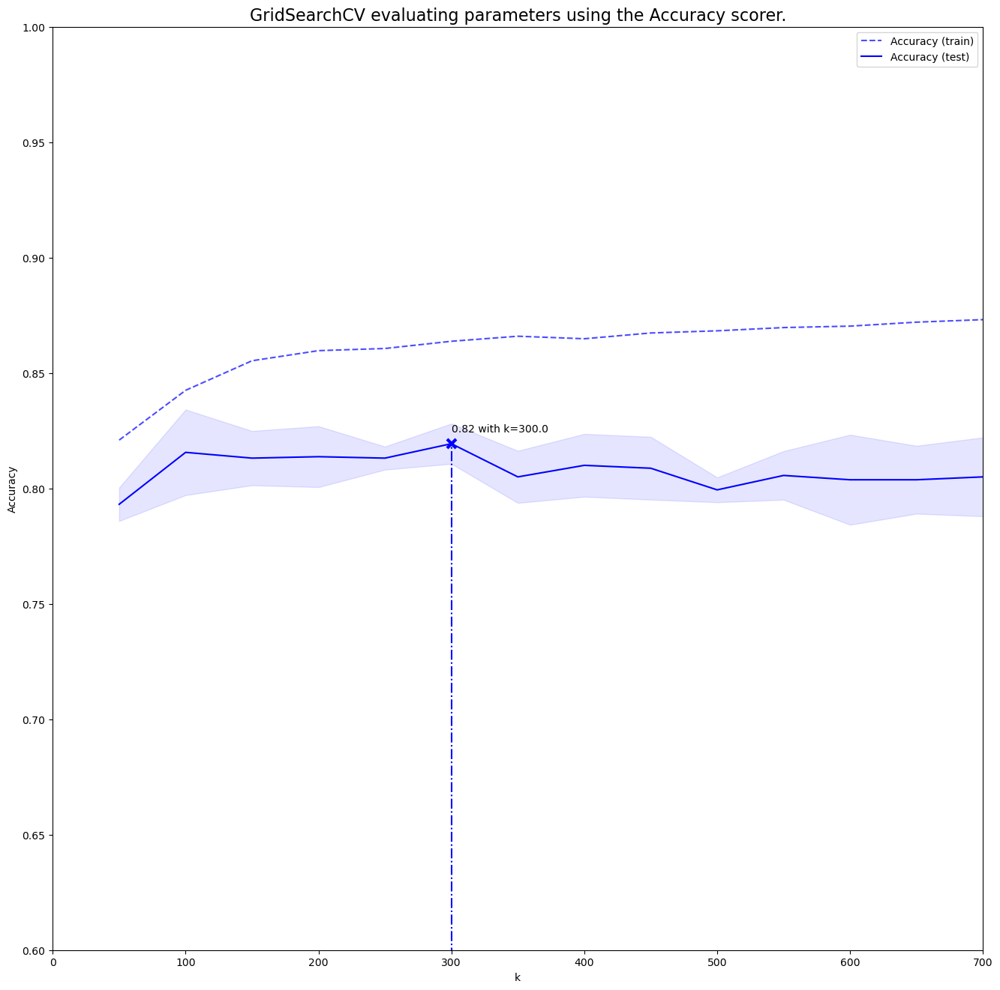

In [28]:
# get our results
results = clf2.cv_results_

plt.figure(figsize=(16, 16))
plt.title("GridSearchCV evaluating parameters using the Accuracy scorer.",
          fontsize=16)

plt.xlabel("k")
plt.ylabel("Accuracy")

ax = plt.gca()

# adjust these according to our accuracy results and range values.
ax.set_xlim(0, 700)
ax.set_ylim(0.60, 1)

# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_selector__k'].data, dtype=float)

for scorer, color in zip(sorted(scoring), ['b']):
    for sample, style in (('train', '--'), ('test', '-')):
        sample_score_mean = results['mean_%s_%s' % (sample, scorer)]
        sample_score_std = results['std_%s_%s' % (sample, scorer)]
        ax.fill_between(X_axis, sample_score_mean - sample_score_std,
                        sample_score_mean + sample_score_std,
                        alpha=0.1 if sample == 'test' else 0, color=color)
        ax.plot(X_axis, sample_score_mean, style, color=color,
                alpha=1 if sample == 'test' else 0.7,
                label="%s (%s)" % (scorer, sample))

    best_index = np.nonzero(results['rank_test_%s' % scorer] == 1)[0][0]
    best_score = results['mean_test_%s' % scorer][best_index]

    # Plot a dotted vertical line at the best score for that scorer marked by x
    ax.plot([X_axis[best_index], ] * 2, [0, best_score],
            linestyle='-.', color=color, marker='x', markeredgewidth=3, ms=8)

    # Annotate the best score for that scorer
    ax.annotate("%0.2f with k=%s" % (best_score, X_axis[best_index]),
                (X_axis[best_index], best_score + 0.005))

plt.legend(loc="best")
plt.grid(False)
plt.show()